In [1]:
# install dependencies: 
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 703.8/703.8 MB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 59.5 MB/s eta 0:00:00
  Attempting uninstall: torch
    Found existing installation: torch 1.13.1+cu116
    Uninstalling torch-1.13.1+cu116:
      Successfully uninstalled torch-1.13.1+cu116
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.14.1+cu116
    Uninstalling torchvision-0.14.1+cu116:
      Successfully uninstalled torchvision-0.14.1+cu116
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.14.1 requires torch==1.13.1, but you have torch 1.5.0+cu101 which is incompatible.
torchaudio 0.13.1+cu116 requires t

In [2]:
import torch

# If there's a GPU available...
if torch.cuda.is_available():    

    # Tell PyTorch to use the GPU.    
    device = torch.device("cuda")

    print('There are %d GPU(s) available.' % torch.cuda.device_count())

    print('We will use the GPU:', torch.cuda.get_device_name(0))
    !nvidia-smi

# If not...
else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

There are 1 GPU(s) available.
We will use the GPU: Tesla T4
Sat Jan 21 07:45:00 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   68C    P8    11W /  70W |      3MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                            

In [3]:
import gdown
url='https://docs.google.com/uc?export=download&id=1_lvjNOUjM_rQYHNpzcuO_QsbTqELWbMs&confirm=t'
output='dataset.zip'
gdown.download(url, output, quiet=False) #, use_cookies=True)

Downloading...
From: https://docs.google.com/uc?export=download&id=1_lvjNOUjM_rQYHNpzcuO_QsbTqELWbMs&confirm=t
To: /content/dataset.zip
100%|██████████| 2.34G/2.34G [00:34<00:00, 67.0MB/s]


'dataset.zip'

In [4]:
import os
os.chdir('/content/')
!unzip -u dataset.zip -d dataset/

Streaming output truncated to the last 5000 lines.
  inflating: dataset/dataset/images/fa2405166ec7764b052959f55b2cb21e.jpg  
  inflating: dataset/dataset/images/2c6cfe092f7ae14cd67f79633e7b329c.jpg  
  inflating: dataset/dataset/images/e25504419a506119a04982130738469a.jpg  
  inflating: dataset/dataset/images/c690dd80504ff3956e1e50a2fbc7c7f4.jpg  
  inflating: dataset/dataset/images/e4b35fb8567c0d8d99de36e96bc4fde9.jpg  
  inflating: dataset/dataset/images/beaf13e79379657b526c349e95821023.jpg  
  inflating: dataset/dataset/images/4e90d0fe2795542468fb5d1cc1834c10.jpg  
  inflating: dataset/dataset/images/5235b7a1aef39d0539839873d5a3418a.jpg  
  inflating: dataset/dataset/images/f48ae52f06f8075c628e6a438e93426f.jpg  
  inflating: dataset/dataset/images/133d32aab2d56507ccb45c9609b2ec48.jpg  
  inflating: dataset/dataset/images/f30492c8c7d9b5d4d939e6035fa73170.jpg  
  inflating: dataset/dataset/images/3403ec3125fd76b911e88ada121e366a.jpg  
  inflating: dataset/dataset/images/be0992e2f3b90

In [5]:
import pandas as pd
all_data_df = pd.read_csv("/content/dataset/dataset/train.csv")
all_data_df

,class,image_path,name,xmax,xmin,ymax,ymin
0,3.0,4a48c42c9579ec0399e6c5a3e825e765.jpg,GARBAGE,797.0,701.0,262.0,211.0
1,3.0,4a48c42c9579ec0399e6c5a3e825e765.jpg,GARBAGE,932.0,786.0,329.0,238.0
2,3.0,4a48c42c9579ec0399e6c5a3e825e765.jpg,GARBAGE,736.0,657.0,275.0,229.0
3,7.0,ea906a663da6321bcef78be4b7d1afff.jpg,BAD_BILLBOARD,986.0,786.0,136.0,0.0
4,8.0,1c7d48005a12d1b19261b8e71df7cafe.jpg,SAND_ON_ROAD,667.0,549.0,228.0,179.0
...,...,...,...,...,...,...,...
19945,4.0,081e7bb3832ec5bb25276db161a96274.jpg,CONSTRUCTION_ROAD,1025.0,600.0,408.0,148.0
19946,2.0,1ff38a7af7f13b1201d17c6e1829373a.jpg,POTHOLES,657.0,418.0,364.0,282.0
19947,2.0,1ff38a7af7f13b1201d17c6e1829373a.jpg,POTHOLES,507.0,338.0,436.0,283.0
19948,7.0,ac97490f13140fc1bfe613ec69301b34.jpg,BAD_BILLBOARD,956.0,713.0,110.0,25.0


In [6]:
all_data_df.loc[all_data_df['name'] == "BAD_STREETLIGHT"]


,class,image_path,name,xmax,xmin,ymax,ymin
19353,6.0,53d3797457a0d2e3afe146e2f797e77e.jpg,BAD_STREETLIGHT,985.0,359.0,161.0,-47.0


In [7]:
all_data_df.drop(all_data_df.index[[19353]], inplace=True)
all_data_df.loc[all_data_df['name'] == "BAD_STREETLIGHT"]


,class,image_path,name,xmax,xmin,ymax,ymin


In [8]:
def adjust_box_x (value):
  if value < 0:
    return 0
  elif value > 1920:
    return 1920
  else:
    return 2*value

def adjust_box_y (value):
  if value < 0:
    return 0
  elif value > 1080:
    return 1080
  else:
    return 2*value

all_data_df["xmin"] = all_data_df["xmin"].apply(adjust_box_x)
all_data_df["xmax"] = all_data_df["xmax"].apply(adjust_box_x)
all_data_df["ymin"] = all_data_df["ymin"].apply(adjust_box_y)
all_data_df["ymax"] = all_data_df["ymax"].apply(adjust_box_y)

all_data_df

,class,image_path,name,xmax,xmin,ymax,ymin
0,3.0,4a48c42c9579ec0399e6c5a3e825e765.jpg,GARBAGE,1594.0,1402.0,524.0,422.0
1,3.0,4a48c42c9579ec0399e6c5a3e825e765.jpg,GARBAGE,1864.0,1572.0,658.0,476.0
2,3.0,4a48c42c9579ec0399e6c5a3e825e765.jpg,GARBAGE,1472.0,1314.0,550.0,458.0
3,7.0,ea906a663da6321bcef78be4b7d1afff.jpg,BAD_BILLBOARD,1972.0,1572.0,272.0,0.0
4,8.0,1c7d48005a12d1b19261b8e71df7cafe.jpg,SAND_ON_ROAD,1334.0,1098.0,456.0,358.0
...,...,...,...,...,...,...,...
19945,4.0,081e7bb3832ec5bb25276db161a96274.jpg,CONSTRUCTION_ROAD,2050.0,1200.0,816.0,296.0
19946,2.0,1ff38a7af7f13b1201d17c6e1829373a.jpg,POTHOLES,1314.0,836.0,728.0,564.0
19947,2.0,1ff38a7af7f13b1201d17c6e1829373a.jpg,POTHOLES,1014.0,676.0,872.0,566.0
19948,7.0,ac97490f13140fc1bfe613ec69301b34.jpg,BAD_BILLBOARD,1912.0,1426.0,220.0,50.0


In [9]:
df_images = pd.DataFrame(all_data_df["image_path"].value_counts())
df_images = df_images.reset_index()
df_images.columns = ['image_path', 'number_of_objects']
df_images

,image_path,number_of_objects
0,291d3a6d38674da0e4b05135008bceb1.jpg,22
1,e76cb6343518dde6aaf5105e5250ebeb.jpg,19
2,0a2bc0dc2371794509f4b776aff0dd88.jpg,19
3,fec90b848c9b6c4bcc1ec562597c55d8.jpg,19
4,8b3335738dc291770ffb3613810128f4.jpg,19
...,...,...
7868,b8c5a771ec3f46006cac8ece1108d5d5.jpg,1
7869,4aacf426bd007ef10fcda6fd5ba875c4.jpg,1
7870,ddf523beb18a11c77462c3fa072b41bd.jpg,1
7871,8fdd463cacbdf40d481232cc30846064.jpg,1


In [10]:
from sklearn.model_selection import train_test_split
train_set, val_set = train_test_split(df_images, test_size=0.10, random_state=42)

In [11]:
train_imgs = train_set["image_path"]
train_data = all_data_df.loc[all_data_df['image_path'].isin(train_imgs)]
train_data.reset_index(drop=True, inplace=True)
train_data

,class,image_path,name,xmax,xmin,ymax,ymin
0,3.0,4a48c42c9579ec0399e6c5a3e825e765.jpg,GARBAGE,1594.0,1402.0,524.0,422.0
1,3.0,4a48c42c9579ec0399e6c5a3e825e765.jpg,GARBAGE,1864.0,1572.0,658.0,476.0
2,3.0,4a48c42c9579ec0399e6c5a3e825e765.jpg,GARBAGE,1472.0,1314.0,550.0,458.0
3,7.0,ea906a663da6321bcef78be4b7d1afff.jpg,BAD_BILLBOARD,1972.0,1572.0,272.0,0.0
4,8.0,1c7d48005a12d1b19261b8e71df7cafe.jpg,SAND_ON_ROAD,1334.0,1098.0,456.0,358.0
...,...,...,...,...,...,...,...
17917,4.0,081e7bb3832ec5bb25276db161a96274.jpg,CONSTRUCTION_ROAD,2050.0,1200.0,816.0,296.0
17918,2.0,1ff38a7af7f13b1201d17c6e1829373a.jpg,POTHOLES,1314.0,836.0,728.0,564.0
17919,2.0,1ff38a7af7f13b1201d17c6e1829373a.jpg,POTHOLES,1014.0,676.0,872.0,566.0
17920,7.0,ac97490f13140fc1bfe613ec69301b34.jpg,BAD_BILLBOARD,1912.0,1426.0,220.0,50.0


In [12]:
val_imgs = val_set["image_path"]
val_data = all_data_df.loc[all_data_df['image_path'].isin(val_imgs)]
val_data.reset_index(drop=True, inplace=True)
val_data

,class,image_path,name,xmax,xmin,ymax,ymin
0,3.0,7fb40d10dde6d5643aa8e197b6b46c2e.jpg,GARBAGE,1702.0,1382.0,448.0,314.0
1,3.0,7fb40d10dde6d5643aa8e197b6b46c2e.jpg,GARBAGE,1330.0,1232.0,440.0,326.0
2,8.0,ee3c87485169dbd1a19e5911e67390f6.jpg,SAND_ON_ROAD,1136.0,958.0,448.0,332.0
3,3.0,ee3c87485169dbd1a19e5911e67390f6.jpg,GARBAGE,1368.0,1150.0,586.0,440.0
4,3.0,ee3c87485169dbd1a19e5911e67390f6.jpg,GARBAGE,190.0,68.0,458.0,382.0
...,...,...,...,...,...,...,...
2022,3.0,54e5855239498a8f858952185b10ae78.jpg,GARBAGE,1206.0,970.0,476.0,314.0
2023,3.0,54e5855239498a8f858952185b10ae78.jpg,GARBAGE,1086.0,910.0,524.0,392.0
2024,3.0,54e5855239498a8f858952185b10ae78.jpg,GARBAGE,744.0,638.0,562.0,436.0
2025,2.0,6f09f2442a6e6658df7053a656e679ec.jpg,POTHOLES,1464.0,328.0,1050.0,540.0


In [13]:
train_data.to_csv("/content/dataset/dataset/train_data.csv")
val_data.to_csv("/content/dataset/dataset/val_data.csv")

In [14]:
import numpy as np
import json
import pandas as pd

def create_coco (path,save_json_path):
  data = pd.read_csv(path)

  images = []
  categories = []
  annotations = []

  category = {}
  category["supercategory"] = 'none'
  category["id"] = 0
  category["name"] = 'None'
  categories.append(category)

  data['fileid'] = data['image_path'].astype('category').cat.codes
  #print(data['fileid'])
  data['categoryid']= pd.Categorical(data['name'],ordered= True).codes
  data['categoryid'] = data['categoryid']+1
  data['annid'] = data.index


  def image(row):
      image = {}
      image["height"] = 1080 #row.height
      image["width"] = 1920 #row.width
      image["id"] = row.fileid
      image["file_name"] = row.image_path
      return image

  def category(row):
      category = {}
      category["supercategory"] = 'None'
      category["id"] = row.categoryid
      category["name"] = row[4]
      return category

  def annotation(row):
      margin_x = 400
      margin_y = 400
      annotation = {}
      
      xcenter = row.xmin+abs((row.xmax-row.xmin)/2)
      ycenter = row.ymin+abs((row.ymin-row.ymax)/2)
      xlength = abs((row.xmax-row.xmin)/2) 
      ylength = abs((row.ymin-row.ymax)/2)
      xmin = xcenter + xlength/2
      ymin = ycenter + ylength/2

      xmax = xcenter -  xlength/2
      ymax = ycenter -  ylength/2

      # xmax = row.xmax
      # ymax = row.ymax
      # xmin = row.xmin
      # ymin = row.ymin
      #print(xmin,xmax,ymin,ymax)

      area = (xmax - xmin)*( ymax -  ymin)
      annotation["segmentation"] = []
      annotation["iscrowd"] = 0
      annotation["area"] = area
      annotation["image_id"] = row.fileid

      annotation["bbox"] = [xmin, ymin, xmax - xmin,ymax - ymin ]

      annotation["category_id"] = row.categoryid
      annotation["id"] = row.annid
      return annotation

  for row in data.itertuples():
      annotations.append(annotation(row))

  imagedf = data.drop_duplicates(subset=['fileid']).sort_values(by='fileid')
  for row in imagedf.itertuples():
      images.append(image(row))

  catdf = data.drop_duplicates(subset=['categoryid']).sort_values(by='categoryid')
  for row in catdf.itertuples():
      categories.append(category(row))

  data_coco = {}
  data_coco["images"] = images
  data_coco["categories"] = categories
  data_coco["annotations"] = annotations


  return json.dump(data_coco, open(save_json_path, "w"), indent=4)


In [15]:
create_coco("/content/dataset/dataset/train_data.csv","/content/dataset/dataset/images/train_coco.json")
create_coco("/content/dataset/dataset/val_data.csv","/content/dataset/dataset/images/val_coco.json")
create_coco("/content/dataset/dataset/train_data.csv","/content/dataset/dataset/train_coco.json")
create_coco("/content/dataset/dataset/val_data.csv","/content/dataset/dataset/val_coco.json")

In [16]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from pathlib import Path
from detectron2.data.datasets import register_coco_instances
from detectron2.data import DatasetCatalog, MetadataCatalog


In [17]:
dataDir=Path('/content/dataset/dataset/images')
register_coco_instances('smartathon_train',{}, '/content/dataset/dataset/images/train_coco.json', dataDir)
register_coco_instances('smartathon_val',{},'/content/dataset/dataset/images/val_coco.json', dataDir)

metadata = MetadataCatalog.get('smartathon_train')
train_ds = DatasetCatalog.get('smartathon_train')

WARNING [01/21 07:45:59 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/21 07:45:59 d2.data.datasets.coco]: Loaded 7085 images in COCO format from /content/dataset/dataset/images/train_coco.json


{'file_name': '/content/dataset/dataset/images/266185932c4c81aaf9ee92f324ee55c1.jpg', 'height': 1080, 'width': 1920, 'image_id': 999, 'annotations': [{'iscrowd': 0, 'bbox': [1051.5, 478.5, -89.0, -71.0], 'category_id': 6, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [847.5, 468.0, -89.0, -44.0], 'category_id': 6, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': 0, 'bbox': [962.0, 474.0, -56.0, -52.0], 'category_id': 6, 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}


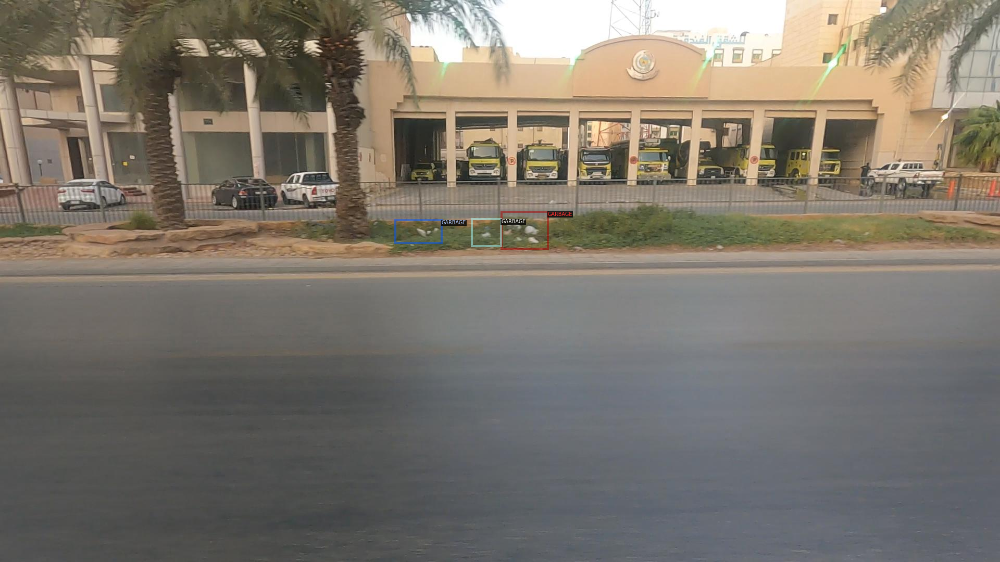

In [18]:
import matplotlib.pyplot as plt
d = train_ds[999]

print(d)
img = cv2.imread(d["file_name"])
visualizer = Visualizer(img[:, :, ::-1], metadata=metadata)
vis = visualizer.draw_dataset_dict(d)
cv2_imshow(vis.get_image()[:, :, ::-1])

In [21]:
# We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [22]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os
cfg = get_cfg()
#cfg.merge_from_file(model_zoo.get_config_file("PascalVOC-Detection/faster_rcnn_R_50_C4.yaml")) 
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")) #Get the basic model configuration from the model zoo 

#Passing the Train and Validation sets
cfg.DATASETS.TRAIN = ("smartathon_train",)
cfg.DATASETS.TEST = ("smartathon_val",)
# Number of data loading threads
cfg.DATALOADER.NUM_WORKERS = 4
#cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("PascalVOC-Detection/faster_rcnn_R_50_C4.yaml")  # Let training initialize from model zoo
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
# Number of images per batch across all machines.
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.01250  # pick a good LearningRate
cfg.SOLVER.MAX_ITER = 25000  #No. of iterations   
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 384 #256  
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 11 
cfg.TEST.EVAL_PERIOD = 250 # No. of iterations after which the Validation Set is evaluated. 
cfg.SOLVER.CHECKPOINT_PERIOD= 250
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)



[01/21 07:47:11 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

In [23]:
# trainer.resume_or_load(resume=False)
# trainer.train()

In [ ]:
#Load phase one trained model (trained earlier)
url='https://docs.google.com/uc?export=download&id=1g5yW1wEEZnllreq68Fmsgs3JfbqA4AzD&confirm=t'
output='phase1_detectron_model.pth'
gdown.download(url, output, quiet=False) #, use_cookies=True)

In [34]:
import detectron2
from pathlib import Path
import random, cv2, os
import matplotlib.pyplot as plt
import numpy as np
from detectron2.utils.visualizer import Visualizer, ColorMode


proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


WARNING [01/21 08:20:20 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/21 08:20:20 d2.data.datasets.coco]: Loaded 788 images in COCO format from /content/dataset/dataset/images/val_coco.json
{'instances': Instances(num_instances=10, image_height=1080, image_width=1920, fields=[pred_boxes: Boxes(tensor([[ 172.2835,  380.1405,  266.2466,  441.4463],
        [1047.0093,  416.9342, 1221.3547,  549.2467],
        [ 765.9650,  449.5185,  930.7090,  532.1489],
        [ 526.0961,  413.2263,  594.9813,  457.3441],
        [1258.9210,  484.3388, 1470.9597,  590.6001],
        [1131.6263,  126.7188, 1213.2570,  248.9832],
        [ 294.3404,  455.8559,  385.3401,  511.3579],
        [ 724.6506,  283.2821,  818.6002,  345.2878],
        [1639.7064,  505.4054, 1832.7390,  619.4332],
        [1656.0510,  512.4278, 1820.6423,  608.0283]], device='cuda:0')), scores: tensor([0.9712, 0.9683, 0.9525, 0.9485, 0.8779, 0.8342, 0.7695, 0

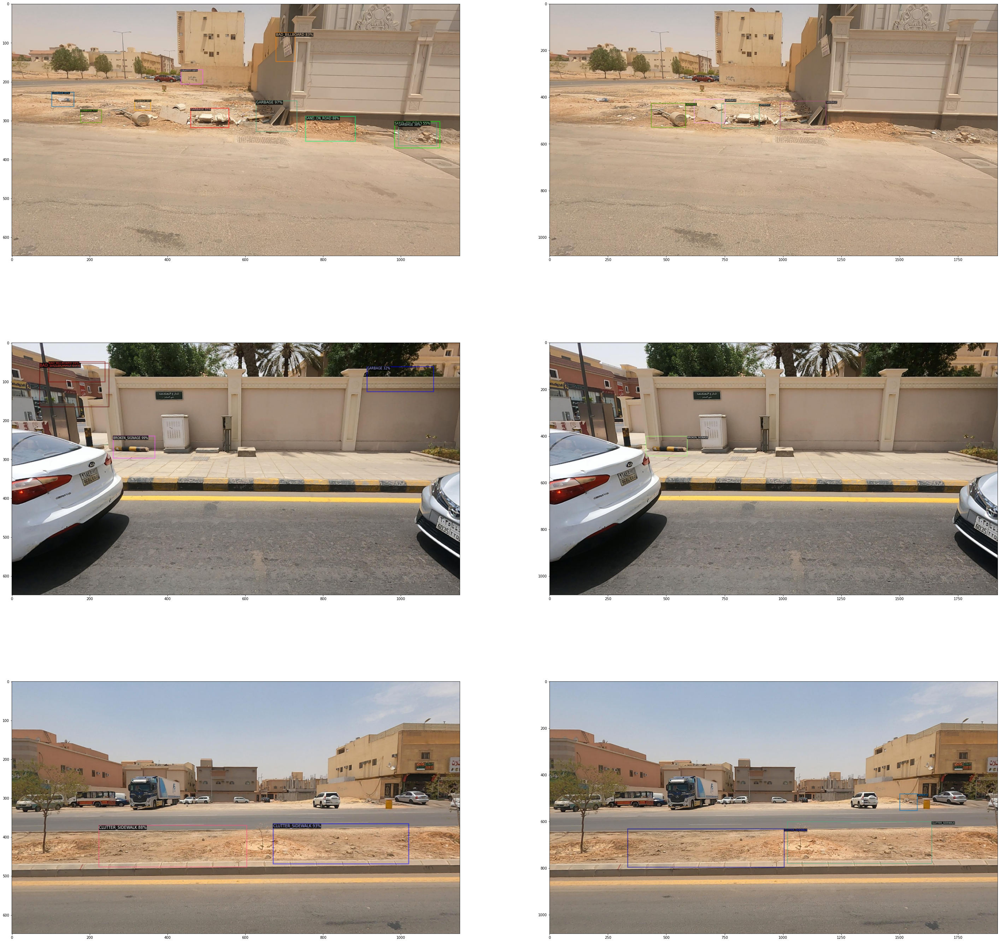

In [35]:
#Test Random Images from validation
import detectron2
from pathlib import Path
import random, cv2, os
import matplotlib.pyplot as plt
import numpy as np
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.utils.visualizer import ColorMode

#Use the final weights generated after successful training for inference  
cfg.MODEL.WEIGHTS = "/content/phase1_detectron_model.pth"
outs = []

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.3  # set the testing threshold for this model
#Pass the validation dataset
cfg.DATASETS.TEST = ("smartathon_val", )

predictor = DefaultPredictor(cfg)

dataset_dicts = DatasetCatalog.get('smartathon_val')

for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    print(outputs)
    v = Visualizer(im[:, :, ::-1],
                   metadata=MetadataCatalog.get('smartathon_train'), 
                   scale=0.6,
                   instance_mode=ColorMode.IMAGE   
    )
    v2 = v.draw_instance_predictions(outputs["instances"].to("cpu")) #Passing the predictions to CPU from the GPU
    visualizer = Visualizer(im[:, :, ::-1], metadata=MetadataCatalog.get('smartathon_train'))
    out_target = visualizer.draw_dataset_dict(d)
    outs.append(v2)
    outs.append(out_target)
_,axs = plt.subplots(len(outs)//2,2,figsize=(50,50))
for ax, out in zip(axs.reshape(-1), outs):
    ax.imshow(out.get_image())


In [36]:
import pandas as pd
test_df = pd.read_csv("/content/dataset/dataset/test.csv")
test_df

,image_path
0,953ab1447c46ecfef67ab14629cd70c7.jpg
1,e4ddbaa7970fca225a51288ce5f7d3f9.jpg
2,5b8120d69607a077b7583334be3ba18b.jpg
3,138b1dc82005b4c33e4886260649d313.jpg
4,0f91ec1533b845b13089f8cf4e0a36f7.jpg
...,...
2087,3e7dd159466f14474a0173e9b02f512a.jpg
2088,a464d4600589ddf541bed59942c0228d.jpg
2089,0a490958aac3c79bb815a0f1f6825284.jpg
2090,15afe8bce6c71deed2d53f56b78b90a8.jpg


In [41]:
from detectron2.utils.visualizer import ColorMode
from tqdm import tqdm

smart_dict={'GRAFFITI' : 0.0 , 'FADED_SIGNAGE': 1.0 , 'POTHOLES': 2.0,
            'GARBAGE' : 3.0 , 'CONSTRUCTION_ROAD': 4.0 , 'BROKEN_SIGNAGE': 5.0,
            'BAD_STREETLIGHT' : 6.0 , 'BAD_BILLBOARD': 7.0 , 'SAND_ON_ROAD':8.0,
            'CLUTTER_SIDEWALK' : 9.0 , 'UNKEPT_FACADE': 10.0}


#Use the final weights generated after successful training for inference  
cfg.MODEL.WEIGHTS ="/content/phase1_detectron_model.pth"

outs = []

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.39 # set the testing threshold for this model
#Pass the validation dataset
cfg.DATASETS.TEST = ("smartathon_val", )

predictor = DefaultPredictor(cfg)

dataset_dicts = DatasetCatalog.get('smartathon_val')

class_names = MetadataCatalog.get("smartathon_train").thing_classes
sub_df = pd.DataFrame(columns=['class','image_path','name','xmax','xmin','ymax','ymin'])
for index, row in tqdm(test_df.iterrows()):  
  t_path = '/content/dataset/dataset/images/'+row["image_path"]
  im = cv2.imread(t_path)
  outputs = predictor(im)
   

  pred_boxes = outputs['instances'].pred_boxes.tensor
  pred_scores = outputs['instances'].scores
  pred_classes = outputs['instances'].pred_classes
  pred_boxes = pred_boxes.cpu().numpy()
  pred_scores = pred_scores.cpu().numpy()
  pred_classes = pred_classes.cpu().numpy()
  
  if len(pred_boxes)>0:
   
    passit = False
    for idx in range(len(pred_boxes)):
      xmin, ymin, xmax, ymax = pred_boxes[idx]
      name = class_names[pred_classes[idx]]
      

      if name == "None":
         continue
         
      pclass = smart_dict[name]
      image_path = row["image_path"]

      if (name == "POTHOLES") and pred_scores[idx] >= 0.2:
        xcenter = xmin+abs((xmax-xmin)/2)
        ycenter = ymin+abs((ymax-ymin)/2)
        xlength = abs((xmax - xcenter))
        ylength = abs((ymax - ycenter))
        xmin = xcenter - 2*xlength 
        ymin = ycenter - 2*ylength 
        xmax = xcenter + 2*xlength
        ymax = ycenter + 2*ylength 
        xmin = xmin/2
        ymin = ymin/2
        xmax = xmax/2
        ymax = ymax/2
        passit = True
        
        
        sub_df = sub_df.append({'class':pclass, 'image_path':image_path, 'name':name, 'xmax':xmax, 'xmin':xmin, 'ymax':ymax, 'ymin':ymin}, ignore_index=True)

      elif pred_scores[idx] >= 0.4 or len(pred_boxes) == 1:
        xcenter = xmin+abs((xmax-xmin)/2)
        ycenter = ymin+abs((ymax-ymin)/2)
        xlength = abs((xmax - xcenter))
        ylength = abs((ymax - ycenter))
        xmin = xcenter - 2*xlength # - 10
        ymin = ycenter - 2*ylength #- 10
        xmax = xcenter + 2*xlength #- 10
        ymax = ycenter + 2*ylength #- 10
        xmin = xmin/2
        ymin = ymin/2
        xmax = xmax/2
        ymax = ymax/2
        passit = True
        sub_df = sub_df.append({'class':pclass, 'image_path':image_path, 'name':name, 'xmax':xmax, 'xmin':xmin, 'ymax':ymax, 'ymin':ymin}, ignore_index=True)

      else:
        continue

    if passit == False:
      sub_df = sub_df.append({'class':3.0, 'image_path':row["image_path"], 'name':"GARBAGE", 'xmax':1260, 'xmin':660, 'ymax':660, 'ymin':420}, ignore_index=True)
 
  else:

    sub_df = sub_df.append({'class':3.0, 'image_path':row["image_path"], 'name':"GARBAGE", 'xmax':1260, 'xmin':660, 'ymax':660, 'ymin':420}, ignore_index=True)


proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


WARNING [01/21 08:32:58 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/21 08:32:58 d2.data.datasets.coco]: Loaded 788 images in COCO format from /content/dataset/dataset/images/val_coco.json


2092it [12:07,  2.88it/s]


In [42]:
sub_df

,class,image_path,name,xmax,xmin,ymax,ymin
0,7.0,953ab1447c46ecfef67ab14629cd70c7.jpg,BAD_BILLBOARD,697.486145,606.953918,226.562103,166.217743
1,7.0,953ab1447c46ecfef67ab14629cd70c7.jpg,BAD_BILLBOARD,693.753754,420.435028,251.982651,162.233322
2,3.0,953ab1447c46ecfef67ab14629cd70c7.jpg,GARBAGE,440.474747,403.340286,294.200607,267.973251
3,3.0,953ab1447c46ecfef67ab14629cd70c7.jpg,GARBAGE,433.227692,381.241241,283.216278,249.541229
4,7.0,953ab1447c46ecfef67ab14629cd70c7.jpg,BAD_BILLBOARD,798.593384,659.204468,121.614651,68.467449
...,...,...,...,...,...,...,...
7855,9.0,984841724143c66506986b3faa50e4b9.jpg,CLUTTER_SIDEWALK,864.853424,574.495148,313.067307,205.335800
7856,9.0,984841724143c66506986b3faa50e4b9.jpg,CLUTTER_SIDEWALK,977.832672,738.950470,309.547188,201.519325
7857,9.0,984841724143c66506986b3faa50e4b9.jpg,CLUTTER_SIDEWALK,688.948395,193.035187,323.956398,207.392647
7858,9.0,984841724143c66506986b3faa50e4b9.jpg,CLUTTER_SIDEWALK,448.635674,-51.566200,334.634605,212.569206


In [43]:
sub_df.to_csv("/content/sub_phase1.csv",index=False)